# Paper Plots, Tables, Macros

Run this notebook from start to finish to (re)generate all the plots, macros, and tables for the paper.

In [1]:
using Pkg
Pkg.activate(joinpath(@__DIR__, ".."))

  Activating project at `~/Research/Bump10MSun`


In [2]:
using ArviZ
using Bump10MSun
using CSV
using DataFrames
using DimensionalData
using Distributions
using LaTeXStrings
using Printf
using Random
using StatsBase
using StatsFuns
using StatsPlots
using Trapz

[ Info: Precompiling Bump10MSun [fdbab76f-f47d-4696-992b-5307153998f4]


## Preliminaries, Loading Data

Setting up reasonable plotting defaults:

In [3]:
colwidth_pt = 433.62
colwidth_in = colwidth_pt / 72.0
ppi = 300.0
default(
    size=(colwidth_in*ppi, colwidth_in*ppi),
    linewidth=4
)
Plots.scalefontsizes()
Plots.scalefontsizes(3)

Loading up the PE samples we are analyzing: adjust the paths below to match what is stored on your computer.

In [4]:
sampso3a, fnameso3a, gwnameso3a = load_pe_samples("/Users/wfarr/Research/gwtc-2.1/", "*GW*_nocosmo.h5", "C01:Mixed/posterior_samples")
sampso3b, fnameso3b, gwnameso3b = load_pe_samples("/Users/wfarr/Research/o3b_data/PE", "*GW*_nocosmo.h5", "C01:Mixed/posterior_samples")
gwtc3_table = DataFrame(CSV.File("/Users/wfarr/Research/gwtc-3-tables/GWTC.csv"))

samps = vcat(sampso3a, sampso3b)
fnames = vcat(fnameso3a, fnameso3b)
gwnames = vcat(gwnameso3a, gwnameso3b)

samps, fnames, gwnames = filter_selected(samps, fnames, gwnames, gwtc3_table)
@info "Analyzing $(length(gwnames)) events:"
for n in gwnames
    @info "  $(n)"
end

┌ Warning: file /Users/wfarr/Research/gwtc-2.1/IGWN-GWTC2p1-v2-GW190425_081805_PEDataRelease_mixed_nocosmo.h5 does not contain C01:Mixed/posterior_samples; skipping
└ @ Bump10MSun ~/Research/Bump10MSun/src/utils.jl:64
┌ Warning: could not find event GW200105_162426 in table
└ @ Bump10MSun ~/Research/Bump10MSun/src/utils.jl:107
[ Info: Analyzing 25 events:
[ Info:   GW151012_095443
[ Info:   GW151226_033853
[ Info:   GW170608_020116
[ Info:   GW190412_053044
[ Info:   GW190512_180714
[ Info:   GW190707_093326
[ Info:   GW190708_232457
[ Info:   GW190720_000836
[ Info:   GW190725_174728
[ Info:   GW190728_064510
[ Info:   GW190814_211039
[ Info:   GW190828_065509
[ Info:   GW190917_114630
[ Info:   GW190924_021846
[ Info:   GW190925_232845
[ Info:   GW190930_133541
[ Info:   GW191103_012549
[ Info:   GW191105_143521
[ Info:   GW191129_134029
[ Info:   GW191204_171526
[ Info:   GW191216_213338
[ Info:   GW200115_042309
[ Info:   GW200202_154313
[ Info:   GW200225_060421
[ Info:   GW200316

Let's load the traces for all the models we have:

In [5]:
traces = Dict(k => from_netcdf(joinpath(@__DIR__, "..", "chains", "chain" * suffix_map[k] * ".nc")) for k in keys(suffix_map))

Dict{Tuple{MassFunction, PowerLawPairing}, InferenceData{(:posterior, :sample_stats)}} with 2 entries:
  (PowerLawGaussian(), Pow… => InferenceData{(:posterior, :sample_stats), Tuple…
  (BrokenPowerLaw(), Power… => InferenceData{(:posterior, :sample_stats), Tuple…

Compute various distributional quantities for each model:

In [6]:
ms = exp.(log(mlow):0.01:log(m_upper_limit))
qs = collect(range(m_lower_limit/m_upper_limit, stop=1, length=128))
ms3 = exp.(log(mlow):0.01:log(m_upper_limit))

function make_distribution_map(dN_maker, xs)
    Dict(
        k => map([traces[k].posterior[v] for v in var_name_map[k[1:2]]]...) do R, args...
            dN = dN_maker(k[1], k[2], args...)
            R .* dN.(xs)
        end for k in keys(traces)
    )
end

dNdm1s = make_distribution_map(make_dNdm1, ms)
dNdm2s = make_distribution_map(make_dNdm2, ms)
dNdqs = make_distribution_map(make_dNdq, qs)

pms = Dict(
    k => map([traces[k].posterior[v] for v in vcat(mf_var_name_map[k[1]], ns_var_names)]...) do R, args...
        p = make_dNdm(k[1], args...)
        pp = p.(ms)
        pp .= pp ./ trapz(ms, pp)
        pp
    end for k in keys(traces)
)

pms3 = Dict(
    k => map([traces[k].posterior[v] for v in vcat(mf_var_name_map[k[1]], ns_var_names)]...) do R, args...
        p = make_dNdm(k[1], args...)
        pp = p.(ms3)
        pp .= pp ./ trapz(ms3, pp)
        pp
    end for k in keys(traces)
)

m1pcts = Dict(
    k => [distribution_quantile(ms3, p, 0.01) for p in v]
    for (k,v) in pairs(pms3)
);

## Figure 1

In Figure 1, we plot the PE samples (likelihood-weighted) that we are analyzing:

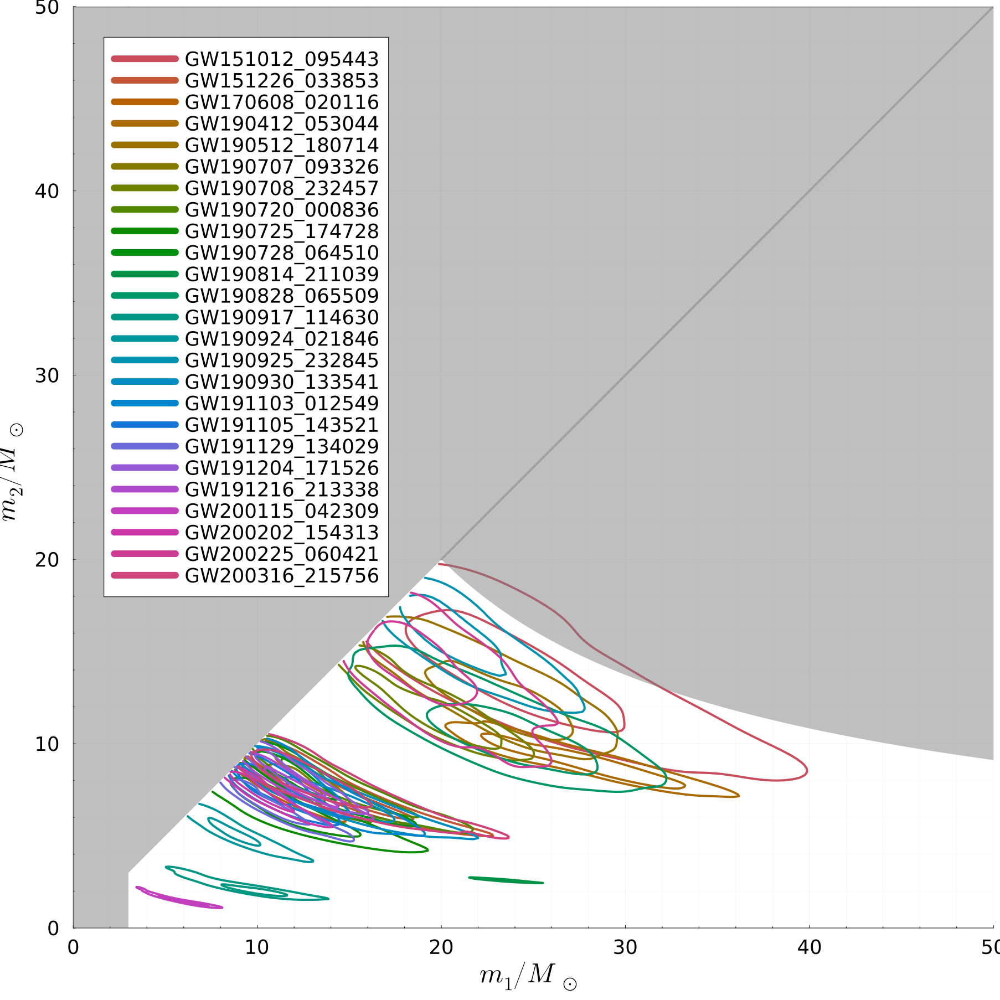

In [7]:
Random.seed!(5766795581209736646)

npt = 1024
p = plot(xlabel=L"m_1 / M_\odot", ylabel=L"m_2 / M_\odot", xlims=(0, m_upper_limit), ylims=(0, m_upper_limit), minorgrid=true, legend_position=:topleft, palette=categorical_palette(length(gwnames)))
for (i, (n, s)) in enumerate(zip(gwnames, samps))
    m1 = [x.mass_1_source for x in s]
    m2 = [x.mass_2_source for x in s]
    z = [x.redshift for x in s]
    wt = md_sfr_zwt.(z) ./ li_prior_wt.(m1, m2, z)
    inds = sample(1:length(z), Weights(wt), npt)
    m1 = m1[inds]
    m2 = m2[inds]

    pts = vcat(m1', m2')
    k = KDE(pts)
    inds = sample(1:size(pts, 2), 128)
    cpts = pts[:, inds]
    ls = logpdf_credible_levels(k, cpts, [0.1, 0.5])

    sig_m1 = std(m1)
    sig_m2 = std(m2)
        
    x = collect(range(minimum(m1)-sig_m1, stop=maximum(m1)+sig_m1, length=129))
    y = collect(range(minimum(m2)-sig_m2, stop=maximum(m2)+sig_m2, length=127))

    Z = [(xx > yy ? logpdf(k, [xx, yy]) : -Inf) for xx in x, yy in y]
    p = contour!(x, y, Z', levels=ls, color=i, cbar=false)
    p = plot!([], [], label=n, color=i)
end

p = plot!([mlow, m_upper_limit], [m_upper_limit, m_upper_limit], fillrange=[mlow, m_upper_limit], color=:grey, alpha=0.5, label=nothing)
p = plot!([0, mlow], [m_upper_limit, m_upper_limit], fillrange=[0,0], color=:grey, alpha=0.5, label=nothing)

m1s = collect(mhigh:0.01:m_upper_limit)
m2s = [bisect(m2 -> chirp_mass(m1, m2)-mchigh, 0, m_upper_limit) for m1 in m1s]
p = plot!(m1s, m1s, fillrange=m2s, color=:grey, alpha=0.5, label=nothing)

savefig(p, joinpath(@__DIR__, "..", "paper", "figures", "m1-m2-contour.pdf"))
p

## Figure 2

This figure shows the merger rates inferred by our two "favored" models, the broken power law and the Gaussian plus broken power law for both primary and secondary masses:

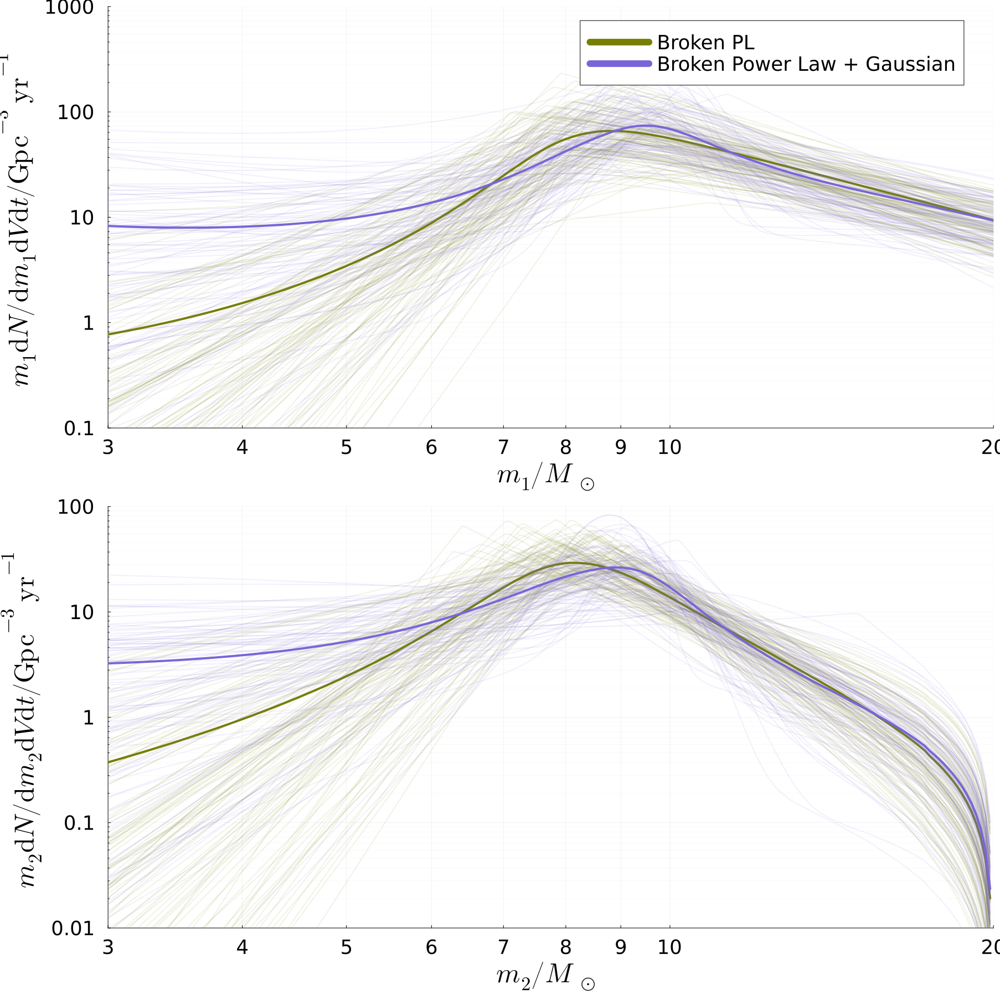

In [8]:
Random.seed!(9054612598149544883)

p1 = plot(xlabel=L"m_1 / M_\odot", ylabel=L"m_1 \mathrm{d} N / \mathrm{d} m_1 \mathrm{d} V \mathrm{d} t / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}", xscale=:log10, yscale=:log10, ylims=(1e-1, 1e3), xlims=(mlow, mhigh), minorgrid=true, minorticks=10, formatter=x->@sprintf("%g", x), xticks=[3,4,5,6,7,8,9,10,20], palette=categorical_palette(2))
p2 = plot(xlabel=L"m_2 / M_\odot", ylabel=L"m_2 \mathrm{d} N / \mathrm{d} m_2 \mathrm{d} V \mathrm{d} t / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}", xscale=:log10, yscale=:log10, ylims=(1e-2, 1e2), xlims=(mlow, mhigh), minorgrid=true, minorticks=10, formatter=x->@sprintf("%g", x), xticks=[3,4,5,6,7,8,9,10,20], palette=categorical_palette(2))
for (i, k) in enumerate([(BrokenPowerLaw(), PowerLawPairing()), (PowerLawGaussian(), PowerLawPairing())])
    p1 = plot!(p1, ms, ms .* mean(dNdm1s[k]), color=i, label=mf_label_map[k[1]])
    for _ in 1:100
        p1 = plot!(p1, ms, ms .* sample(dNdm1s[k]), color=i, label=nothing, alpha=0.1, lw=2)
    end

    p2 = plot!(p2, ms, ms .* mean(dNdm2s[k]), color=i, label=nothing)
    for _ in 1:100
        p2 = plot!(p2, ms, ms .* sample(dNdm2s[k]), color=i, label=nothing, alpha=0.1, lw=2)
    end
end
p = plot(p1, p2, layout=(2,1))
savefig(p, joinpath(@__DIR__, "..", "paper", "figures", "dNdm_traces.pdf"))
p

## Figure 3

This figure shows the inferred common mass function ($p(m)$) for each of the two models, as well as the inferred $m_{1\%}$.

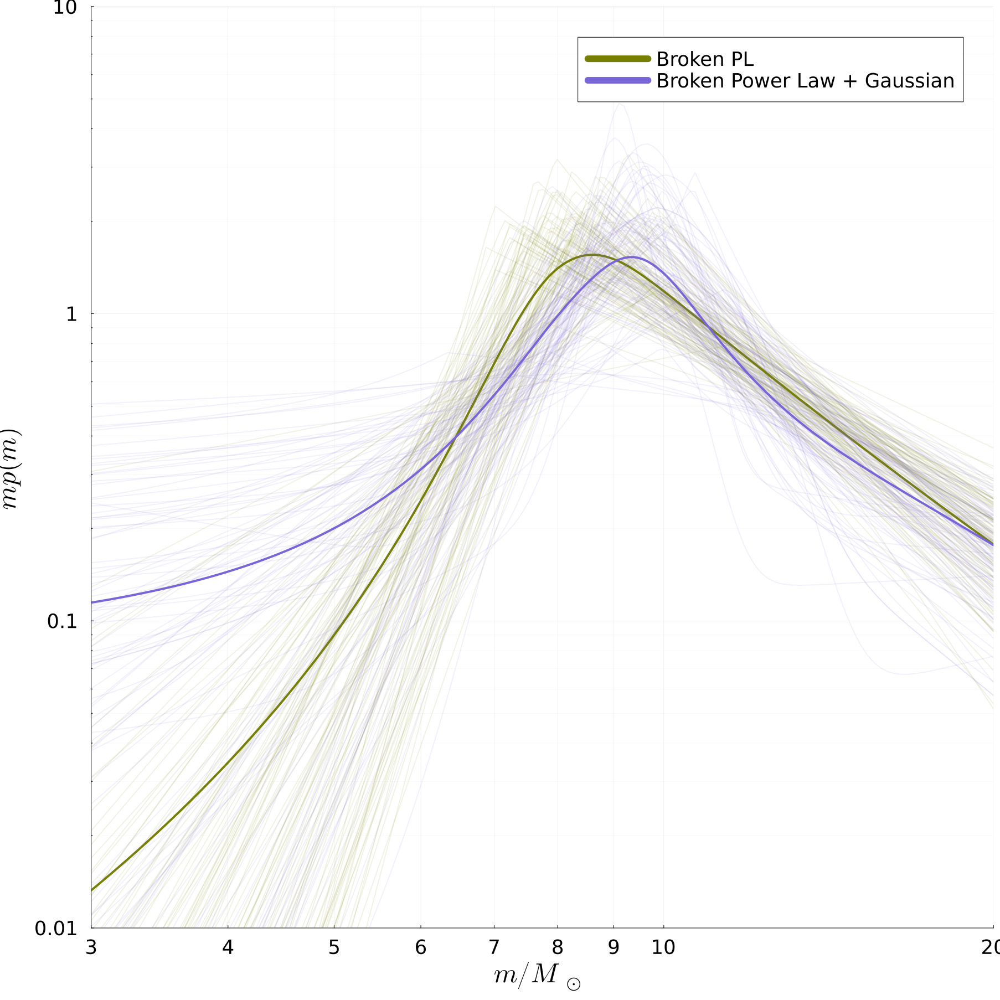

In [9]:
Random.seed!(3495738867787726282)

yl, yh = 1e-2, 10
p = plot(xlabel=L"m / M_\odot", ylabel=L"m p(m)", minorgrid=true, xlims=(mlow, mhigh), ylims=(yl, yh), xscale=:log10, yscale=:log10, formatter=x->@sprintf("%g", x), xticks=[3, 4, 5, 6, 7, 8, 9, 10, 20], palette=categorical_palette(2))

for (i, k) in enumerate([(BrokenPowerLaw(), PowerLawPairing()), (PowerLawGaussian(), PowerLawPairing())])
    pm = pms[k]

    p = plot!(ms, ms .* mean(pm), label=mf_label_map[k[1]], color=i)
    for _ in 1:100
        p = plot!(ms, ms .* sample(pm), label=nothing, alpha=0.1, color=i, lw=2)
    end

    # m1p = vec([distribution_quantile(ms, p, 0.01) for p in pm])
    # m1_med = median(m1p)
    # m1_l = quantile(m1p, 0.16)
    # m1_ll = quantile(m1p, 0.025)
    # m1_h = quantile(m1p, 0.84)
    # m1_hh = quantile(m1p, 0.975)

    # p = plot!([m1_med, m1_med], [yl, yh], color=cs[i], lw=4, label=nothing)
    # p = plot!([m1_l, m1_h], [yh, yh], fillrange=[yl,yl], color=cs[i], alpha=0.2, label=nothing)
    # p = plot!([m1_ll, m1_hh], [yh, yh], fillrange=[yl,yl], color=cs[i], alpha=0.2, label=nothing)
end
savefig(p, joinpath(@__DIR__, "..", "paper", "figures", "pm_traces.pdf"))
p

## Figure 4

This figure shows the $m_{1\%}$ from the "common" mass function for each model:

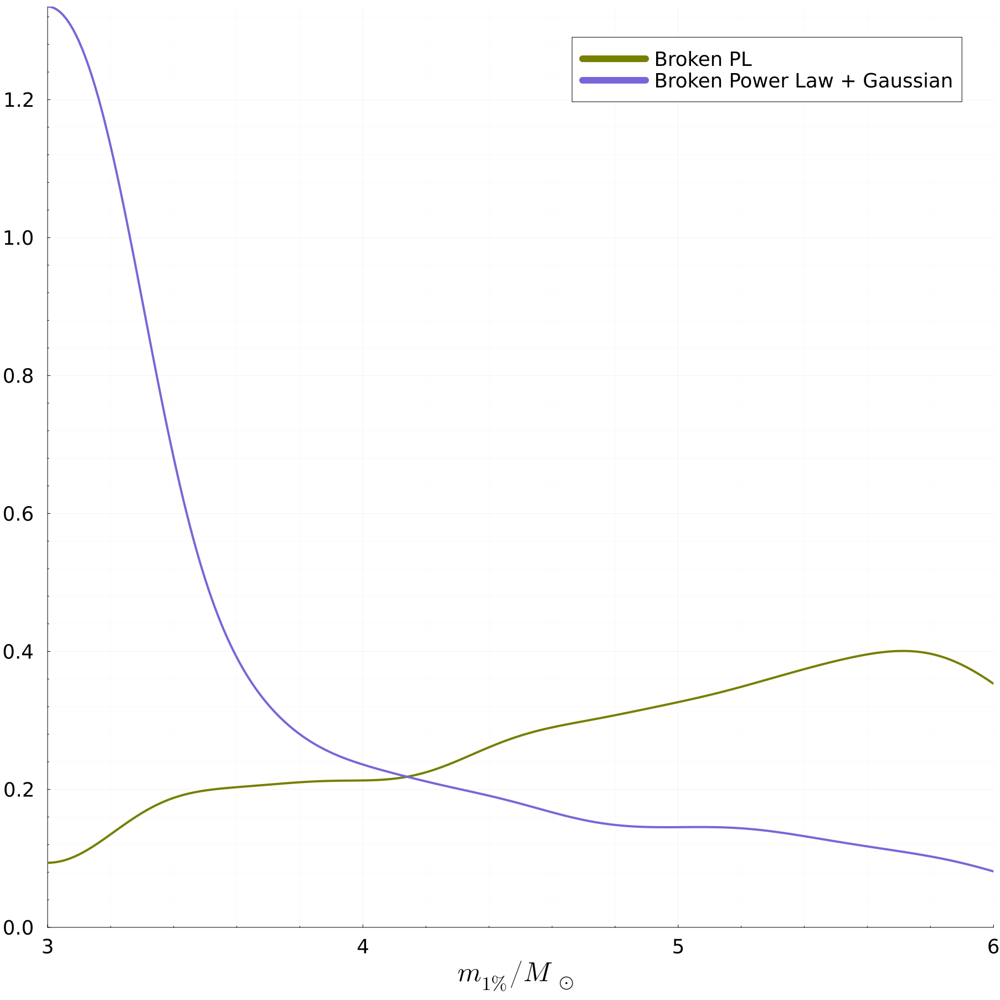

In [10]:
p = plot(xlabel=L"m_{1\%} / M_\odot", ylims=(0, Inf), xlims=(3, Inf), minorgrid=true, palette=categorical_palette(2))

xs = 3:0.01:6
for (i, k) in enumerate([(BrokenPowerLaw(), PowerLawPairing()), (PowerLawGaussian(), PowerLawPairing())])
    sf = default_selection_fraction
    kde = BoundedKDE(vec(m1pcts[k]), lower=3)
    p = plot!(xs, pdf.((kde,), xs), color=i, label=mf_label_map[k[1]])
end
savefig(p, joinpath(@__DIR__, "..", "paper", "figures", "m1pct.pdf"))
p

##### Macros

In [11]:
function write_macro(f, s)
    @info "Writing macro: $(s)"
    write(f, s)
end

open(joinpath(@__DIR__, "..", "paper", "result_macros.tex"), "w") do f
    write_macro(f, result_macro(raw"\dNlogmpeak", raw"\mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}", traces[PowerLawGaussian(), PowerLawPairing()].posterior.R, digits=0))
    write_macro(f, result_macro(raw"\monepctplgplp", raw"M_\odot", m1pcts[PowerLawGaussian(), PowerLawPairing()], digits=2))
    write_macro(f, result_macro(raw"\mpeakplgplp", raw"M_\odot", traces[PowerLawGaussian(), PowerLawPairing()].posterior.mu, digits=2))
    write_macro(f, result_macro(raw"\alphatwoplgplp", traces[PowerLawGaussian(), PowerLawPairing()].posterior.a2, digits=1))
    write_macro(f, "\\newcommand{\\mlow}{$(mlow)}\n\\newcommand{\\mlowunits}{\\ensuremath{\\mlow \\, M_\\odot}}")
    write_macro(f, "\\newcommand{\\mclow}{$(mclow)}\n\\newcommand{\\mclowunits}{\\ensuremath{\\mclow \\, M_\\odot}}")
    write_macro(f, "\\newcommand{\\mchigh}{$(mchigh)}\n\\newcommand{\\mchighunits}{\\ensuremath{\\mchigh \\, M_\\odot}}")
    write_macro(f, "\\newcommand{\\mhigh}{$(mhigh)}\n\\newcommand{\\mhighunits}{\\ensuremath{\\mhigh \\, M_\\odot}}")
    write_macro(f, "\\newcommand{\\nevts}{$(length(gwnames))}")
end

┌ Info: Writing macro: \newcommand{\dNlogmpeak}{\ensuremath{106^{+99}_{-52}}}
└ \newcommand{\dNlogmpeakunits}{\ensuremath{\dNlogmpeak \, \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}}}
┌ Info: Writing macro: \newcommand{\monepctplgplp}{\ensuremath{3.47^{+1.57}_{-0.35}}}
└ \newcommand{\monepctplgplpunits}{\ensuremath{\monepctplgplp \, M_\odot}}
┌ Info: Writing macro: \newcommand{\mpeakplgplp}{\ensuremath{9.18^{+0.64}_{-0.86}}}
└ \newcommand{\mpeakplgplpunits}{\ensuremath{\mpeakplgplp \, M_\odot}}
[ Info: Writing macro: \newcommand{\alphatwoplgplp}{\ensuremath{-2.5^{+1.4}_{-3.4}}}
┌ Info: Writing macro: \newcommand{\mlow}{3.0}
└ \newcommand{\mlowunits}{\ensuremath{\mlow \, M_\odot}}
┌ Info: Writing macro: \newcommand{\mclow}{2.612}
└ \newcommand{\mclowunits}{\ensuremath{\mclow \, M_\odot}}
┌ Info: Writing macro: \newcommand{\mchigh}{17.41}
└ \newcommand{\mchighunits}{\ensuremath{\mchigh \, M_\odot}}
┌ Info: Writing macro: \newcommand{\mhigh}{20.0}
└ \newcommand{\mhighunits}{\ensuremath{\mhigh \,

23

## Table 1

This table gives the constraints on $m_{1\%}$ in all our various models:

In [12]:
open(joinpath(@__DIR__, "..", "paper", "table1_content.tex"), "w") do f
    write(f, "\\begin{deluxetable}{llll}\n\\tablecolumns{3}\n\\tablecaption{\\label{tab:monepct} \$m_{1\\%}\$ for our various models and using different selection functions.}\n")
    write(f, "\\tablehead{\\colhead{Mass Function Model} & \\colhead{\$m_{1\\%} / M_\\odot\$ (1-\$\\sigma\$, 68\\%)} & \\colhead{\$m_{1\\%} / M_\\odot\$ range (2-\$\\sigma\$, 95\\%)}}\n")
    write(f, "\\startdata\n")
    for mf in [BrokenPowerLaw(), PowerLawGaussian()]
        k = (mf, PowerLawPairing())
        m1p = m1pcts[k]

        m, h, l = median_plus_minus(vec(m1p), 0.68)
        ll, hh = quantile.((vec(m1p),), [0.025, 0.975])

        write(f, "\\texttt{" * mf_label_map[mf] * "}")
        write(f, @sprintf("& \$%.2f^{+%.2f}_{-%.2f}\$", m, h-m, m-l))
        write(f, @sprintf("& \$\\left[%.1f, %.1f \\right]\$", ll, hh))
        write(f, "\\\\ \n")
    end
    write(f, "\\enddata\n\\end{deluxetable}\n")
end

27